In [56]:
import json, scipy
from scipy.interpolate import griddata
from scipy.spatial import Delaunay
from skimage.draw import polygon
import matplotlib.pyplot as plt
import numpy as np
import cv2
import imageio
from PIL import Image
import os
import glob
from harris import *
from matplotlib.patches import ConnectionPatch


plt.rcParams['figure.figsize'] = (8.0, 8.0)


def normalized_image(final):
    return (final-final.min())/(final.max()-final.min())


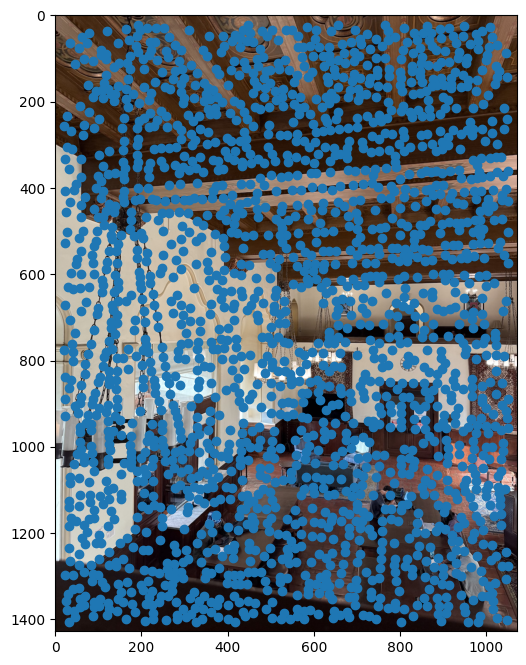

In [57]:
hall1 = plt.imread('data/hall1.jpeg')
hall1_grey = cv2.imread("data/hall1.jpeg")
hall1_grey = cv2.cvtColor(hall1_grey, cv2.COLOR_BGR2GRAY)

h, coords = get_harris_corners(hall1_grey)
plt.plot(coords[1, :], coords[0, :], 'o')
plt.imshow(hall1)
# plt.imshow(h, cmap='hot')


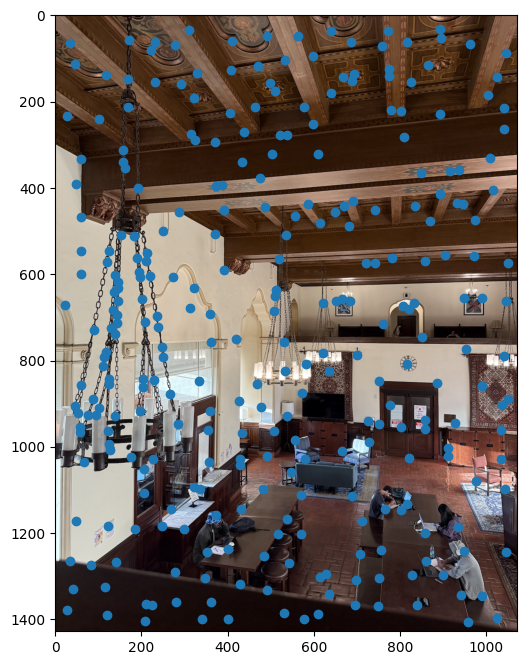

In [58]:
def anms(coordinates, h, no_points):
    # Our array of coordinates and strengths is already sorted
    no = coordinates.shape[1]
    # First initialize array with radius as inifinity
    radius_array = np.full(no, np.inf)
    # for each keypoint, we calculate the distance to all other coordinates
    # As explained in the paper: Once we add an interest point into our array it will stay in the array. since if an interest point is
    # because if its a max in r then its also a max in r': r' < r.
    for i in range(1, no):
        # Compare to all other points
        for j in range(i):
            # 0.9 since that was recommended in the paper
            if h[coordinates[0, i], coordinates[1, i]] < 0.9 * h[coordinates[0, j], coordinates[1, j]]:
                distance = np.linalg.norm(coordinates[:, i] - coordinates[:, j])
                if distance < radius_array[i]:
                    radius_array[i] = distance
    
    # Now we only select out best points by cutting the sorted array off at "numb_points" 
    selected_points = np.argsort(-radius_array)[:no_points]
    selected_coordinates = coordinates[:, selected_points]
    return selected_coordinates

coords_adaptive = anms(coords, h, 300)
plt.plot(coords_adaptive[1, :], coords_adaptive[0, :], 'o')
plt.imshow(hall1)

(300, 64)


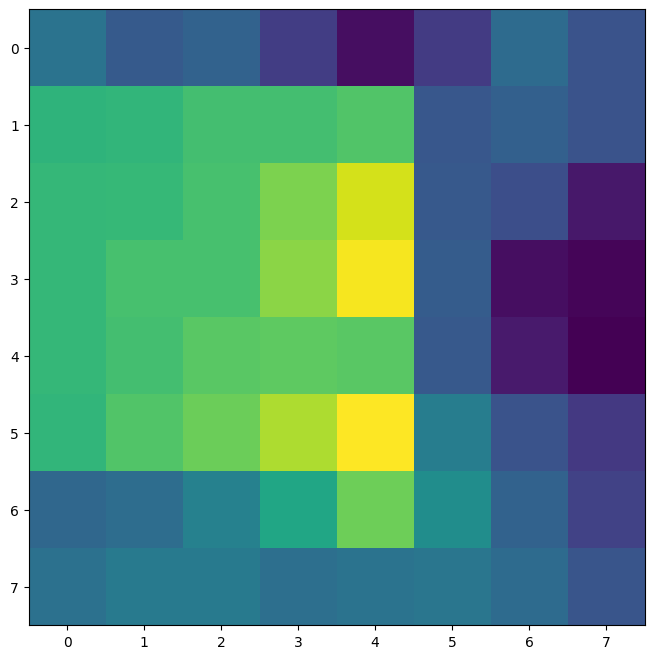

In [59]:
# Lets extract the feature descriptors now
def extract_feature_descriptor(coords_adaptive, img):
    no = coords_adaptive.shape[1]
    feature_descriptors = []
    for i in range(no):
        x_start = coords_adaptive[1, i] - 20
        x_end = coords_adaptive[1, i] + 20
        y_start = coords_adaptive[0, i] - 20
        y_end = coords_adaptive[0, i] + 20   
        patch2020 = img[y_start:y_end, x_start:x_end]
        patch_8x8 = cv2.resize(patch2020, (8, 8), interpolation=cv2.INTER_AREA)
        feature_descriptors.append(normalized_image(patch_8x8))
    return np.array(feature_descriptors)

feature_destriptors = extract_feature_descriptor(coords_adaptive, hall1_grey)
feature_destriptors_flattened = feature_destriptors.reshape((feature_destriptors.shape[0], -1))

print(feature_destriptors_flattened.shape)
plt.imshow(feature_destriptors[2])



In [60]:
# We have descriptors for first image, now we need to get them for the second image
hall2 = plt.imread('data/hall2.jpeg')
hall2_grey = cv2.imread("data/hall2.jpeg")
hall2_grey = cv2.cvtColor(hall2_grey, cv2.COLOR_BGR2GRAY)

h2, coords2 = get_harris_corners(hall2_grey)
coords_adaptive2 = anms(coords2, h2, 300)
feature_destriptors2 = extract_feature_descriptor(coords_adaptive2, hall2_grey)
feature_destriptors_flattened2 = feature_destriptors2.reshape((feature_destriptors2.shape[0], -1))




In [61]:
print(feature_destriptors2.shape)
print(feature_destriptors_flattened[0].shape)

(300, 8, 8)
(64,)


In [62]:
# Lets do feature matching now
def match_features(feature_destriptors_flattened, feature_destriptors_flattened2):
    distances = dist2(feature_destriptors_flattened, feature_destriptors_flattened2)
    # Sort, the response is [0 94] where 0 is the nearest and 94 is the second nearest match
    smallest_indices = np.argsort(distances, axis=1)[:, :2] # row in distance matches which column for the least distance
    ratio_1NN_2NN = distances[np.arange(distances.shape[0]), smallest_indices[:, 0]] / distances[np.arange(distances.shape[0]), smallest_indices[:, 1]]
    # ratio_1NN_2NN = distances[np.arange(distances.shape[0]), smallest_indices[:, 0]]
    # ratio_1NN_2NN lower is better, 
    # tells us how good feature_destriptors_flattened[i] matches smallest_indices[i, 0]
    ratio_1NN_2NN_sorted = np.argsort(ratio_1NN_2NN)
    # for i in ratio_1NN_2NN_sorted:
    #     print(distances[i, smallest_indices[i, 0]])
    #     print(i, smallest_indices[i, 0])
    return ratio_1NN_2NN_sorted, smallest_indices
    # ommgg this finally works, jesus christ
ratio_1NN_2NN_sorted, smallest_indices = match_features(feature_destriptors_flattened, feature_destriptors_flattened2)


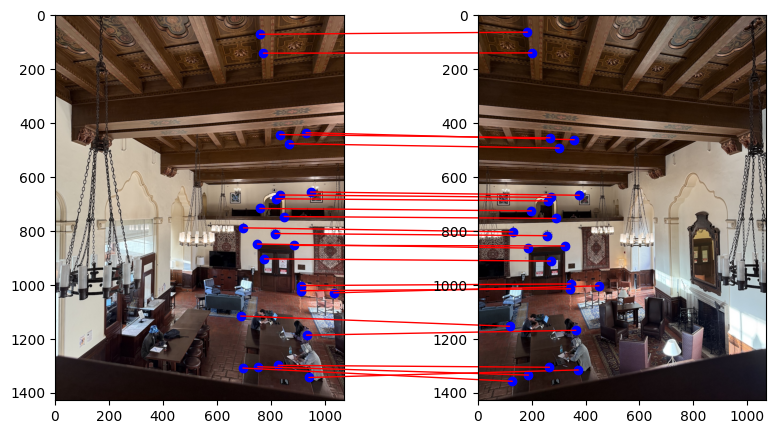

In [63]:
# In this box im just plotting the results
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

ax[0].imshow(hall1)
ax[1].imshow(hall2)

# plotting the 24 best matches
# why 24? idk could be any number i guess
for i in ratio_1NN_2NN_sorted[:24]:
    # points in im1 and 2
    point_im1 = coords_adaptive[1, i], coords_adaptive[0, i]
    point_im2 = coords_adaptive2[1, smallest_indices[i, 0]], coords_adaptive2[0, smallest_indices[i, 0]]
    # plot the points
    ax[0].scatter(coords_adaptive[1, i], coords_adaptive[0, i], color='blue')
    ax[1].scatter(coords_adaptive2[1, smallest_indices[i, 0]], coords_adaptive2[0, smallest_indices[i, 0]], color='blue')
    # Draw the lines between the points
    con = ConnectionPatch(xyA=point_im1, xyB=point_im2, coordsA="data", coordsB="data", axesA=ax[0], axesB=ax[1], color="red")
    ax[1].add_artist(con)
plt.show()

In [64]:
# We need some functions from our notebook from part 4A:

# Calculating the homography matrix
def computeH(p1s, p2s):
    A = None
    b = None
    if len(p1s) != len(p2s):
        raise IndexError("points not the same length")
    for p1, p2 in zip(p1s,p2s):
        u1 = p1[0]
        v1 = p1[1]
        u2 = p2[0]
        v2 = p2[1]
        # stackig the points using the formula on my website
        aaa = np.array([[u1, v1, 1, 0, 0, 0, -u1*u2, -v1*u2], [0, 0, 0, u1, v1, 1, -u1*v2, -v1*v2]])
        bbb = np.array([[u2],[v2]])
        if A is None:
            A = aaa
        else:
            A = np.vstack((aaa, A))
        if b is None:
            b = bbb
        else:
            b = np.vstack((bbb, b))
        # using least squares to find the best solution for our points
        h_vec = np.linalg.lstsq(A,b, rcond=None)[0]
    # Reshape to get the homography matrix
    h_vec = np.vstack((h_vec, [1]))
    return(h_vec.reshape(3, 3))

def warp_point(pt, H):
    # input : points_to_transform2 = np.float32([[30, 30], [70, 30], [70, 70]])
    # Input an inversed H for the inverse warp
    # eg warp_point(transformed_points, np.linalg.inv(homography_matrix))
    pt = np.hstack((pt.reshape(-1, 2), np.ones(pt.shape[0]).reshape(-1, 1)))
    warped = H@pt.T
    # We get a 3xn with values [x, y, 1].T
    warped /= warped[2, :]
    # return first row x and second row y, colum are the points
    return warped[:2]

def warpit(im, H, size):
    # First make an empty image of target size
    # result = np.full((size[1], size[0], 3), 255)
    # We also add a alpha parameter
    result = np.zeros((size[1], size[0], 4), dtype=np.uint8)
    # Loop over all pixels in destination image
    for i in range(size[1]):  # y height
        for j in range(size[0]):  # x width
            # Inverse homography to tell us which pixel in the source image we should use
            xy1 = np.linalg.inv(H)@np.array([j, i, 1])
            xy1 /= xy1[2]
            x = int(xy1[0])
            y = int(xy1[1])

            # Only use pixels inside the bounds of the image
            if 0 <= x < im.shape[1] and 0 <= y < im.shape[0]:
                # NN interpolation
                # result[i, j] = im[int(y), int(x)]
                result[i, j] = np.append(im[int(y), int(x)], 255)
    return result

def get_warped_image(hall1, hall2, homography):
    # These are the original corners of the input image warped with the momography into the destination image, so we know
    # How big our final image should be
    corners = warp_point(np.float32([[0, 0], [hall2.shape[1], 0], [0, hall2.shape[0]],[hall2.shape[1], hall2.shape[0]]]), homography)

    min_width = np.min(corners[0, :])
    min_height = np.min(corners[1, :])
    max_width = np.max(corners[0, :])
    max_height = np.max(corners[1, :])
    new_width = int(max_width - min_width)
    new_height = int(max_height - min_height)

    # Shifting our pixels so that ever pixel location is poisitive
    translation_matrix = np.array([[1, 0, -min_width],
                                [0, 1, -min_height],
                                [0, 0, 1]])

    shifted_homography = translation_matrix @ homography
    # Getting our final warped images
    warped_hall1 = warpit(hall1, shifted_homography, (int(hall2.shape[1]-min(min_width, 0)), int(hall2.shape[0]-min(min_height, 0))))
    warped_hall2 = warpit(hall2, translation_matrix, (int(hall2.shape[1]-min(min_width, 0)), int(hall2.shape[0]-min(min_height, 0))))
    # put pixels into range of 0-1
    warped_hall1 = warped_hall1 / 255.0
    warped_hall2 = warped_hall2 / 255.0
    return warped_hall1, warped_hall2

def go_mosaic(warped_hall1, warped_hall2, half_mask):
    times = 4 # inital was 6

    def convolve_channels(image, kernel):
        new_image = np.zeros_like(image)
        for i in range(image.shape[2]):
            new_image[:,:,i] = scipy.signal.convolve2d(image[:,:,i], kernel, mode='same', boundary='symm')
            # We could use this instead of scipy.signal.convolve2d, as it is faster, but its behaves a little differently:
            # new_image[:,:,i] = cv2.filter2D(image[:,:,i], ddepth=-1, kernel=kernel)
        return new_image
    def get_stacked_gau(img):
        stack_gau = []
        stack_gau.append(img)
        for i in range(times - 1):
            # To archive the same amount of blurring effect, we multiply sigma by 2 for each additional iteration
            sigma = (i + 1) * 2
            # I like to have a small peak in my gaussian, so I added 1, else its kind of a flat "peak"
            kernelsize = sigma * 6 + 1
            gaussian_kernel = cv2.getGaussianKernel(kernelsize,sigma).T * cv2.getGaussianKernel(kernelsize,sigma)
            blurry_image = convolve_channels(stack_gau[i], gaussian_kernel)
            stack_gau.append(blurry_image)
        return stack_gau

    def get_stacked_lap(stacked_gau):
        stack_lap = []
        for i in range(times - 1):
            # Getting the high frequency part by subtracting the blurred image from the original image
            stack_lap.append(stacked_gau[i] - stacked_gau[i + 1])
        stack_lap.append(stacked_gau[i])
        return stack_lap

    def show_images(image_stack):
        fig, axs = plt.subplots(1, len(image_stack), figsize=(15, 5)) 
        for i in range(len(image_stack)):
            axs[i].imshow(normalized_image(image_stack[i])) 
            axs[i].axis('off') 
        plt.show()

    round_half_mask_stack_gau = []
    round_half_mask_stack_gau.append(half_mask)

    # We are doing 6 layers for our stack, so we need to do 5 more
    for i in range(times-1):
        # To archive the same amount of blurring effect, we multiply sigma by 2 for each additional iteration
        sigma = (i + 1) * 2
        # I like to have a small peak in my gaussian, so I added 1, else its kind of a flat "peak"
        kernelsize = sigma * 6 + 1
        gaussian_kernel = cv2.getGaussianKernel(kernelsize,sigma).T * cv2.getGaussianKernel(kernelsize,sigma)
        # We need to choose symm for boundary here because else we get like a weird black border around the white part
        blurry_image_half_mask = scipy.signal.convolve2d(round_half_mask_stack_gau[i], gaussian_kernel, mode='same', boundary='symm')
        round_half_mask_stack_gau.append(blurry_image_half_mask)

    # Show the images
    fig, axs = plt.subplots(1, 6, figsize=(15, 5)) 
    for i in range(times):
        axs[i].imshow(round_half_mask_stack_gau[i], cmap='gray') 
        axs[i].axis('off') 
        # A lazy hack so that I can just multiply the mask with the image later
        round_half_mask_stack_gau[i] = np.stack([round_half_mask_stack_gau[i]] * 3, axis=-1)
    plt.show()

    # Lets do it with with a lot of detail using the laplacian stack
    oranapple = warped_hall1[:,:,:-1]
    oranapple_stack_gau = get_stacked_gau(oranapple)

    show_images(oranapple_stack_gau)

    # Lets do the Laplacian Stack now
    oranapple_stack_lap = get_stacked_lap(oranapple_stack_gau)

    show_images(oranapple_stack_lap)

    watermelon = warped_hall2[:,:,:-1]
    watermelon_stack_gau = get_stacked_gau(watermelon)

    show_images(watermelon_stack_gau)

    # Lets do the Lapclacian Stack now
    watermelon_stack_lap = get_stacked_lap(watermelon_stack_gau)

    show_images(watermelon_stack_lap)

    left_arr = []
    right_arr = []
    final_arr = []
    for i in range(times):
        temp = []
        left = oranapple_stack_lap[i] * round_half_mask_stack_gau[i]
        right = watermelon_stack_lap[i] * (1 - round_half_mask_stack_gau[i])
        temp_final = left + right
        left_arr.append(left)
        right_arr.append(right)
        final_arr.append(temp_final)
        fig, axs = plt.subplots(1, 3, figsize=(15, 5))
        axs[0].imshow(normalized_image(left))
        axs[1].imshow(normalized_image(right))
        axs[2].imshow(normalized_image(temp_final))
        axs[0].axis('off')
        axs[1].axis('off')
        axs[2].axis('off')
        plt.show()

    final_left = 0
    final_right = 0
    final = 0

    for i in range(times):
        final_left += left_arr[i]
        final_right += right_arr[i]
        final += final_arr[i]

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(normalized_image(final_left))
    axs[1].imshow(normalized_image(final_right))
    axs[2].imshow(normalized_image(final))
    axs[0].axis('off')
    axs[1].axis('off')
    axs[2].axis('off')

    plt.show()
    return final


20


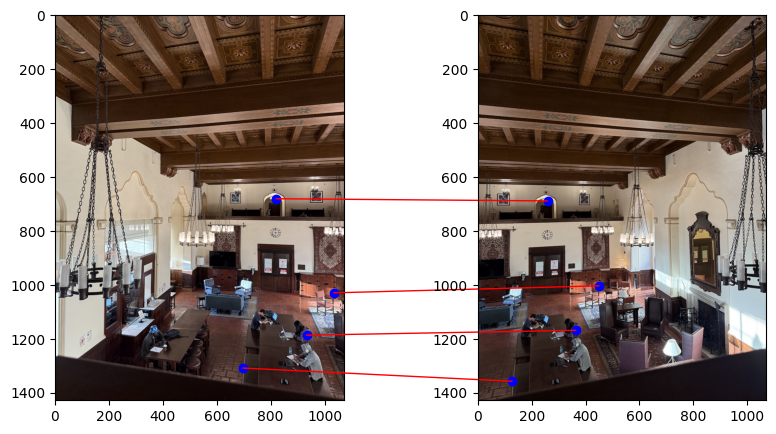

In [66]:
# Lets get started with ransac
# 1. Select 4 features and compute the exact homography
# 2. Compute inliers that are within a threshold
# 3. Repeat 1-2
# 4. Return the homography with the most inliers

def ransac(ratio_1NN_2NN_sorted, no_points=24):
    ratio_1NN_2NN_sorted_reduced = ratio_1NN_2NN_sorted[:no_points]
    best_inliers = 0
    best_four_pairs_im1 = None
    best_four_pairs_im2 = None
    best_h = None
    for i in range(no_points):
        # get 4 random point pairs
        random_values = np.random.choice(ratio_1NN_2NN_sorted_reduced, 4, replace=False)
        four_pairs_im1 = np.array([])
        four_pairs_im2 = np.array([])
        for j in random_values:
            point_im1 = np.array((coords_adaptive[1, j], coords_adaptive[0, j]))
            point_im2 = np.array((coords_adaptive2[1, smallest_indices[j, 0]], coords_adaptive2[0, smallest_indices[j, 0]]))
            if four_pairs_im1.size == 0:
                four_pairs_im1 = np.array([point_im1])
            else:
                four_pairs_im1 = np.vstack((four_pairs_im1, point_im1))

            if four_pairs_im2.size == 0:
                four_pairs_im2 = np.array([point_im2])
            else:
                four_pairs_im2 = np.vstack((four_pairs_im2, point_im2))
        # Now we have our four_pairs_im1 and four_pairs_im2
        # Compute the homography matrix
        H = computeH(four_pairs_im1, four_pairs_im2)
        # Compute the inliers
        inliers = 0
        for j in ratio_1NN_2NN_sorted_reduced:
            point_im1 = np.array((coords_adaptive[1, j], coords_adaptive[0, j]))
            point_im2 = np.array((coords_adaptive2[1, smallest_indices[j, 0]], coords_adaptive2[0, smallest_indices[j, 0]]))
            point1in2 = H @ np.array([point_im1[0], point_im1[1], 1])
            point1in2 = point1in2 / point1in2[2]
            distance = np.linalg.norm(point1in2[:2] - point_im2)
            if distance < 5:
                inliers += 1
        if inliers > best_inliers:
            best_inliers = inliers
            best_four_pairs_im1 = four_pairs_im1
            best_four_pairs_im2 = four_pairs_im2
            best_h = H
    print(best_inliers)
    return best_four_pairs_im1, best_four_pairs_im2, best_h

best_four_pairs_im1, best_four_pairs_im2, best_h = ransac(ratio_1NN_2NN_sorted)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(hall1)
ax[1].imshow(hall2)
for i in range(4):
    # points in im1 and 2
    point_im1 = best_four_pairs_im1[i, 0], best_four_pairs_im1[i, 1]
    point_im2 = best_four_pairs_im2[i, 0], best_four_pairs_im2[i, 1]
    # plot the points
    ax[0].scatter(best_four_pairs_im1[i, 0], best_four_pairs_im1[i, 1], color='blue')
    ax[1].scatter(best_four_pairs_im2[i, 0], best_four_pairs_im2[i, 1], color='blue')
    # Draw the lines between the points
    con = ConnectionPatch(xyA=point_im1, xyB=point_im2, coordsA="data", coordsB="data", axesA=ax[0], axesB=ax[1], color="red")
    ax[1].add_artist(con)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..2.0].


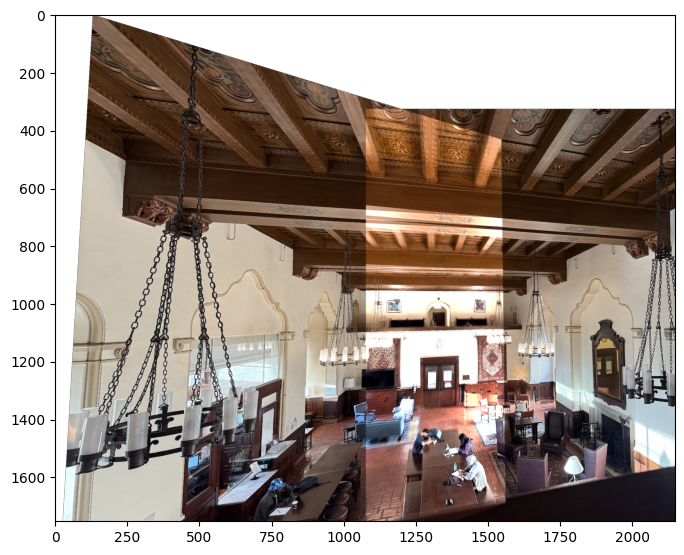

In [38]:
warped_hall1, warped_hall2 = get_warped_image(hall1, hall2, best_h)
plt.imshow(warped_hall1 + warped_hall2)

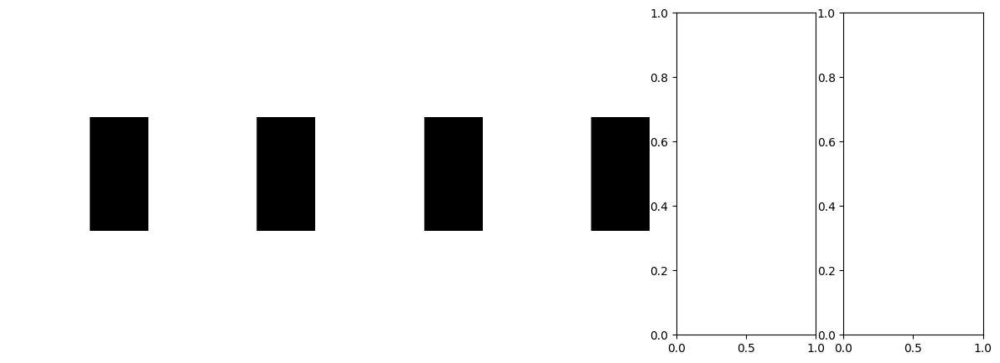

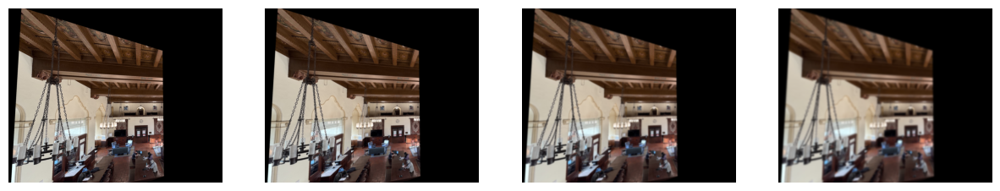

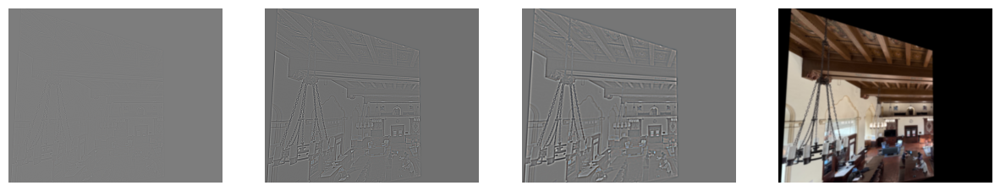

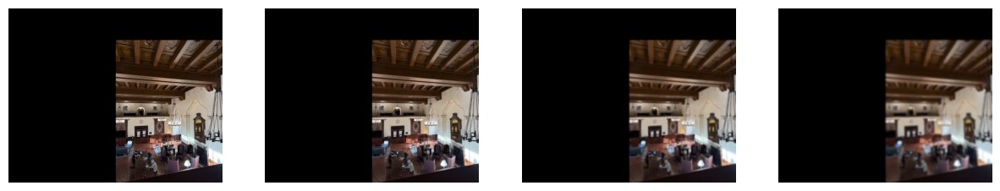

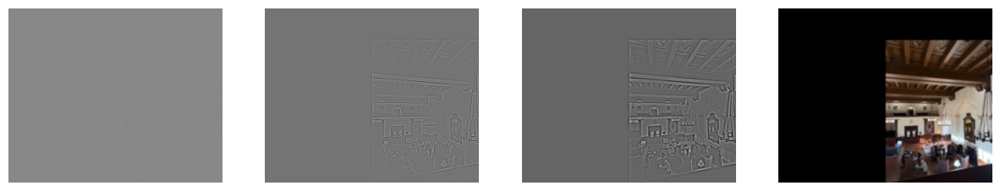

...

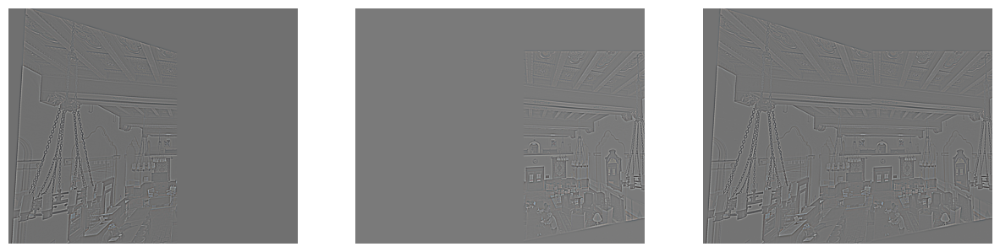

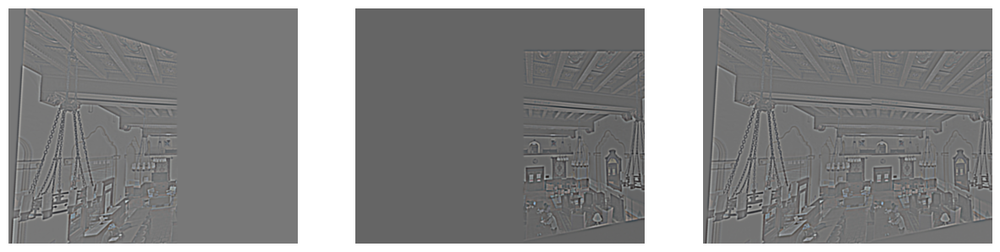

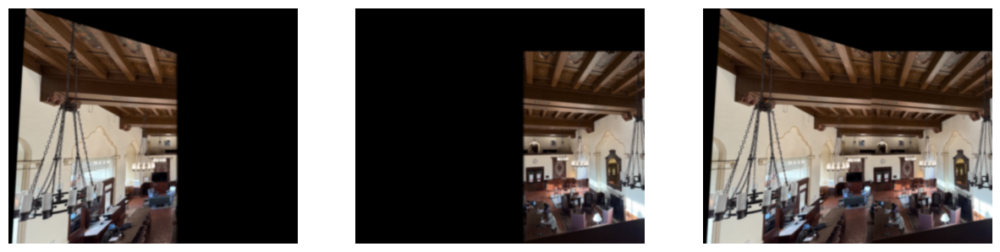

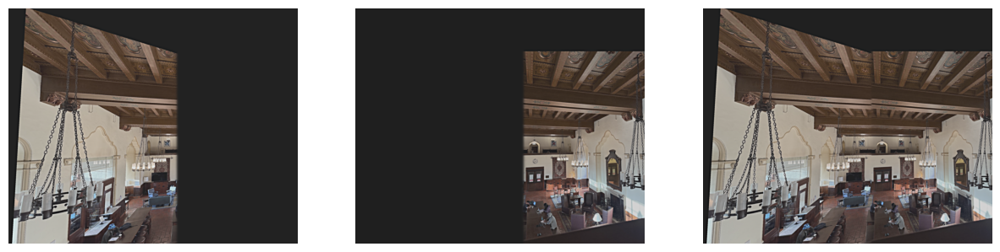

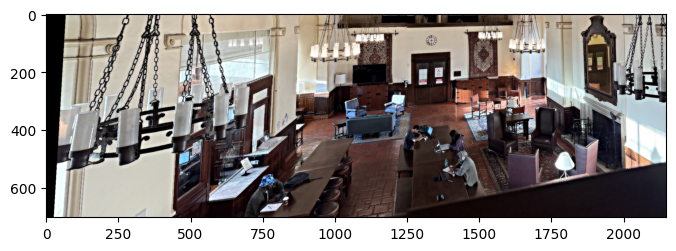

In [39]:
# Create Mask
half_mask = np.zeros(warped_hall1.shape[:-1], dtype=np.uint8)

# We want half of the matrix to be white
half_cols = warped_hall1.shape[1] // 2
half_mask[:, :1250] = 1

new = go_mosaic(warped_hall1, warped_hall2, half_mask)[1050:]
data_clipped = np.clip(new, 0, 1)
plt.imshow(data_clipped)
plt.show()
plt.imsave('output/ransac_mosaic1_final.jpg', data_clipped)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..2.0].


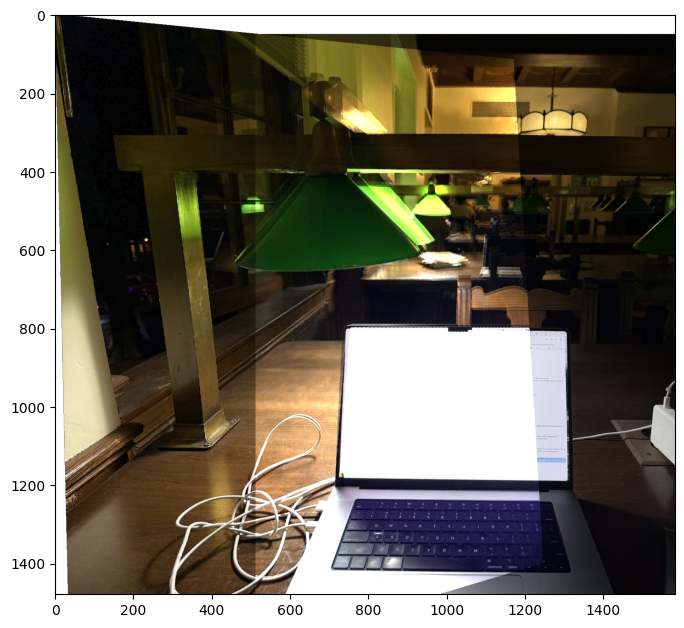

In [44]:
hw1 = plt.imread('data/hw1.jpeg')
hw2 = plt.imread('data/hw2.jpeg')
hw1_grey = cv2.cvtColor(hw1, cv2.COLOR_BGR2GRAY)
hw2_grey = cv2.cvtColor(hw2, cv2.COLOR_BGR2GRAY)

h, coords = get_harris_corners(hw1_grey)
h2, coords2 = get_harris_corners(hw2_grey)
coords_adaptive = anms(coords, h, 500)
coords_adaptive2 = anms(coords2, h2, 500)
feature_destriptors = extract_feature_descriptor(coords_adaptive, hw1_grey)
feature_destriptors_flattened = feature_destriptors.reshape((feature_destriptors.shape[0], -1))
feature_destriptors2 = extract_feature_descriptor(coords_adaptive2, hw2_grey)
feature_destriptors_flattened2 = feature_destriptors2.reshape((feature_destriptors2.shape[0], -1))
ratio_1NN_2NN_sorted, smallest_indices = match_features(feature_destriptors_flattened, feature_destriptors_flattened2)
_, _, best_hw_h = ransac(ratio_1NN_2NN_sorted, 80)

warped_hw1, warped_hw2 = get_warped_image(hw1, hw2, best_hw_h)
plt.imshow(warped_hw1 + warped_hw2)

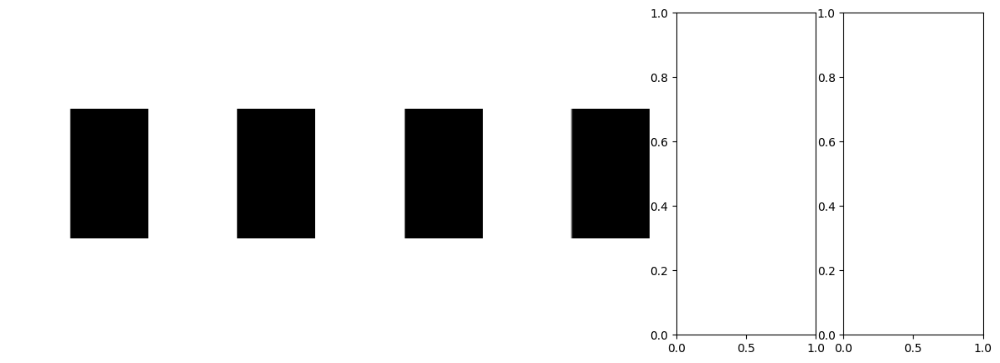

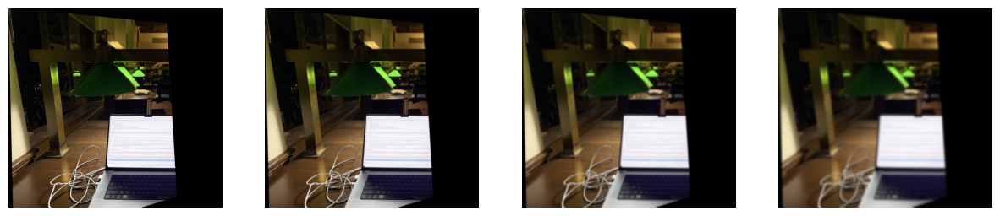

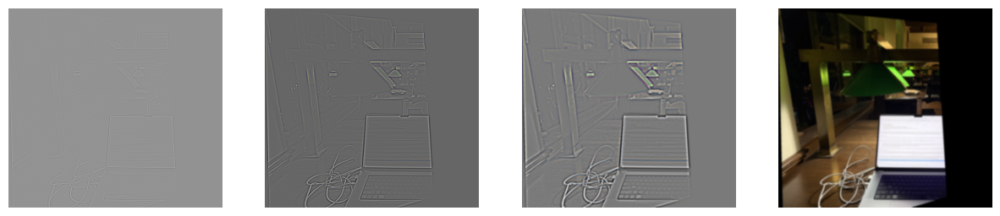

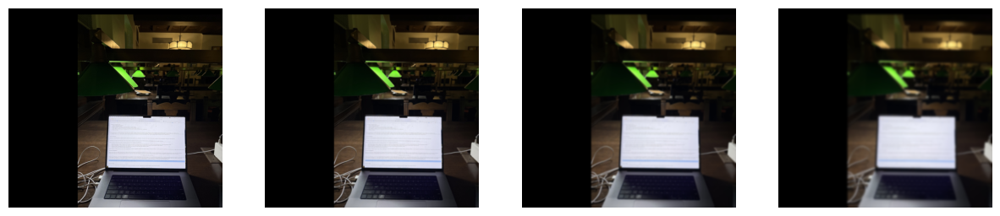

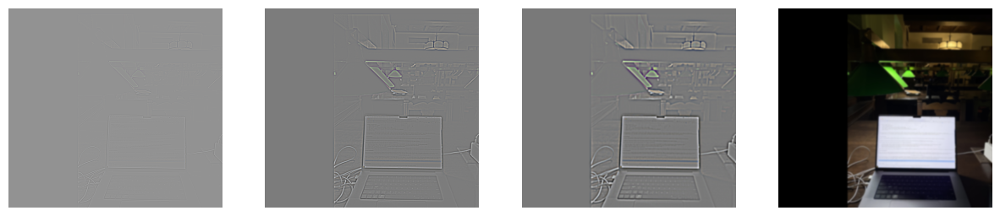

...

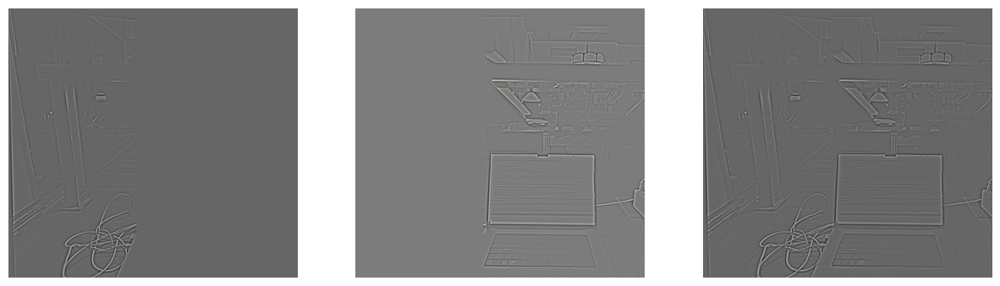

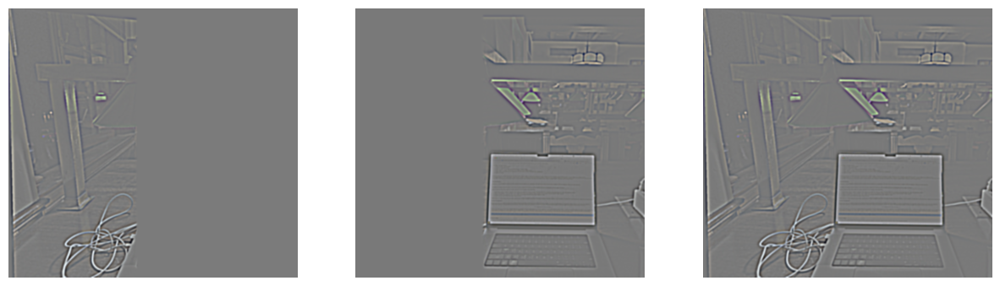

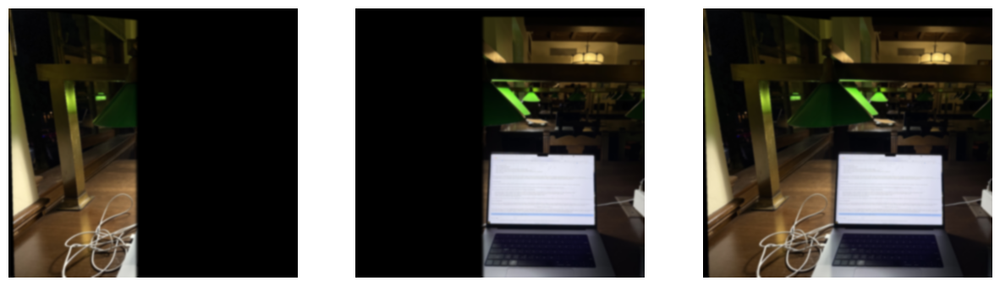

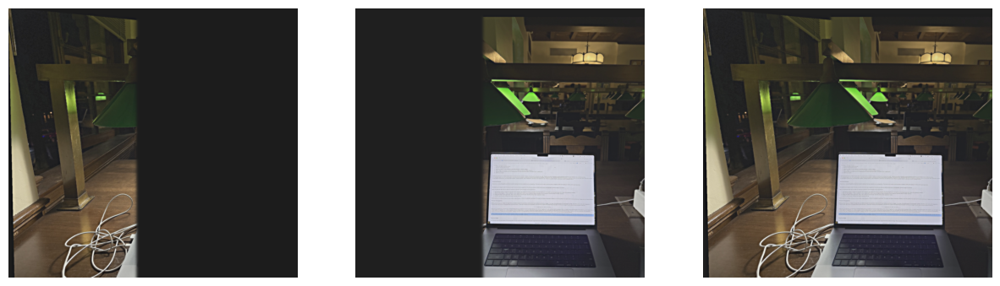

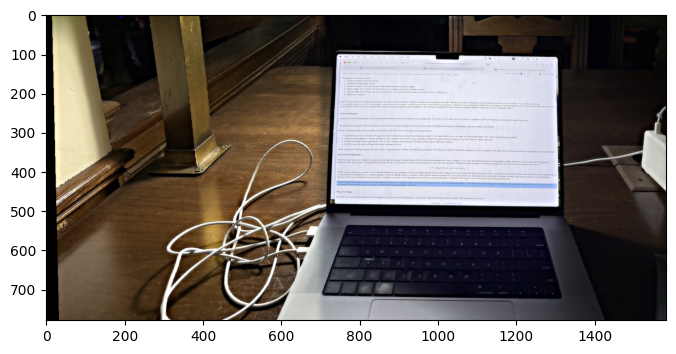

In [46]:
# Create Mask
half_mask = np.zeros(warped_hw1.shape[:-1], dtype=np.uint8)

# We want half of the matrix to be white
half_mask[:, :700] = 1

# The bar on top is like waay to close to the camera which makes the result seem confusing which is why i cut it
new = go_mosaic(warped_hw1, warped_hw2, half_mask)[700:]
data_clipped = np.clip(new, 0, 1)
plt.imshow(data_clipped)
plt.show()
plt.imsave('output/ransac_mosaic2_final.jpg', data_clipped)

/var/folders/m1/63ns6dts5dlf4t76wyvsczgm0000gn/T/ipykernel_52922/1425425715.py:20: RuntimeWarning: invalid value encountered in divide
  return (final-final.min())/(final.max()-final.min())
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..2.0].


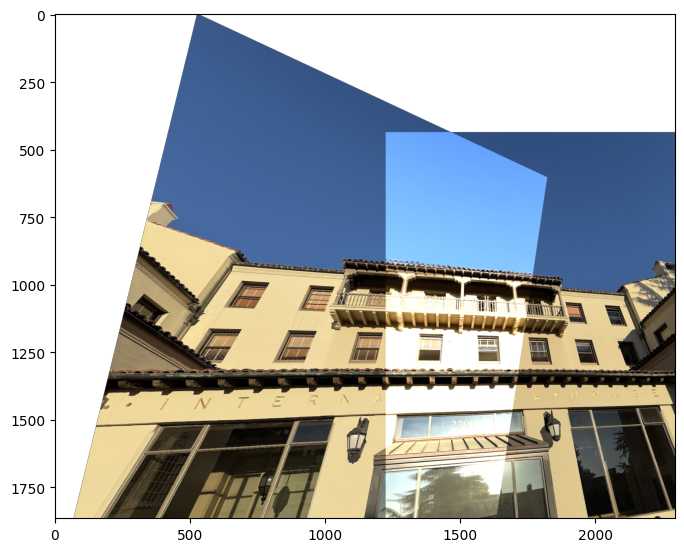

In [49]:
hw1 = plt.imread('data/ihouse1.jpeg')
hw2 = plt.imread('data/ihouse2.jpeg')
hw1_grey = cv2.cvtColor(hw1, cv2.COLOR_BGR2GRAY)
hw2_grey = cv2.cvtColor(hw2, cv2.COLOR_BGR2GRAY)

h, coords = get_harris_corners(hw1_grey)
h2, coords2 = get_harris_corners(hw2_grey)
coords_adaptive = anms(coords, h, 1000)
coords_adaptive2 = anms(coords2, h2, 1000)
feature_destriptors = extract_feature_descriptor(coords_adaptive, hw1_grey)
feature_destriptors_flattened = feature_destriptors.reshape((feature_destriptors.shape[0], -1))
feature_destriptors2 = extract_feature_descriptor(coords_adaptive2, hw2_grey)
feature_destriptors_flattened2 = feature_destriptors2.reshape((feature_destriptors2.shape[0], -1))
ratio_1NN_2NN_sorted, smallest_indices = match_features(feature_destriptors_flattened, feature_destriptors_flattened2)
_, _, best_hw_h = ransac(ratio_1NN_2NN_sorted, 150)

warped_hw1, warped_hw2 = get_warped_image(hw1, hw2, best_hw_h)
plt.imshow(warped_hw1 + warped_hw2)

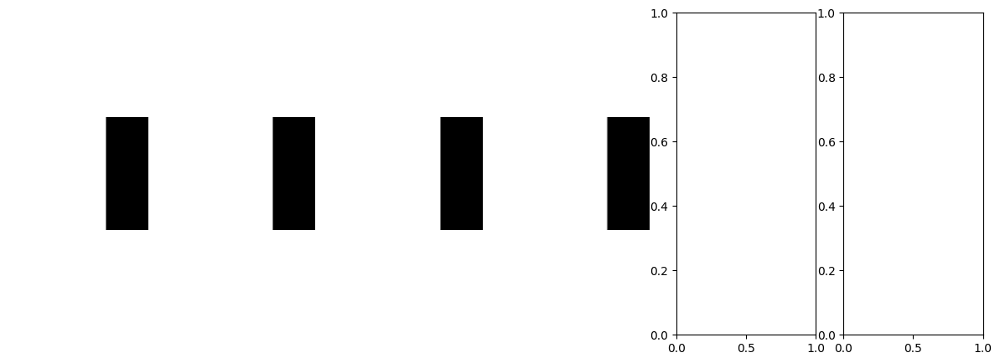

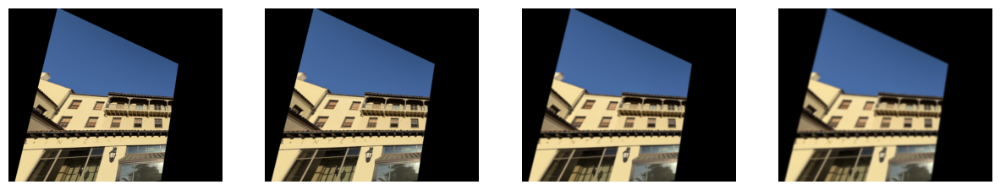

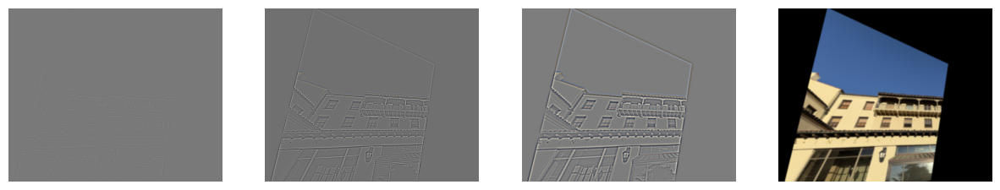

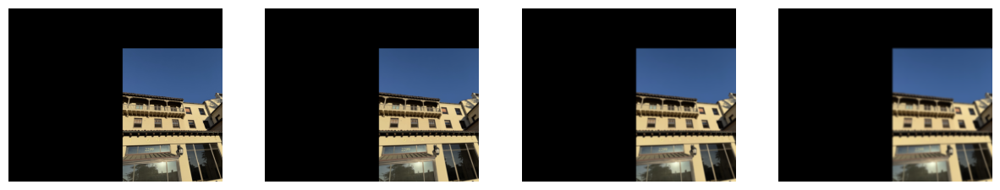

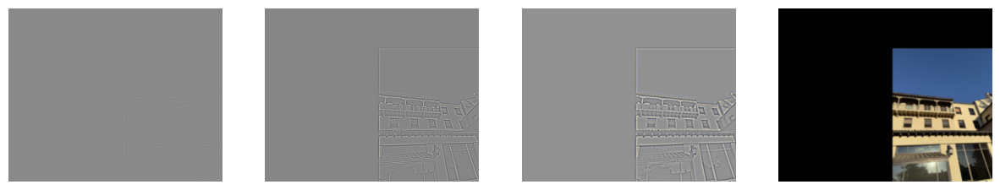

...

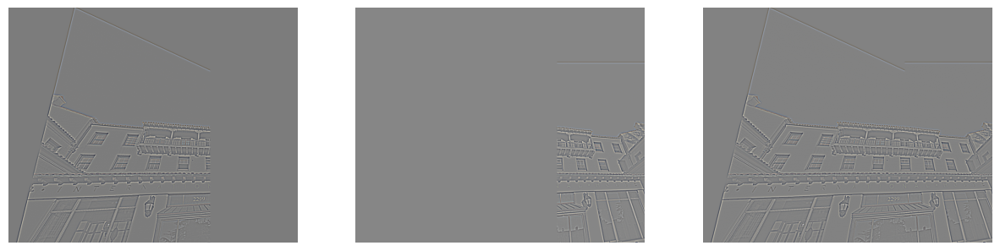

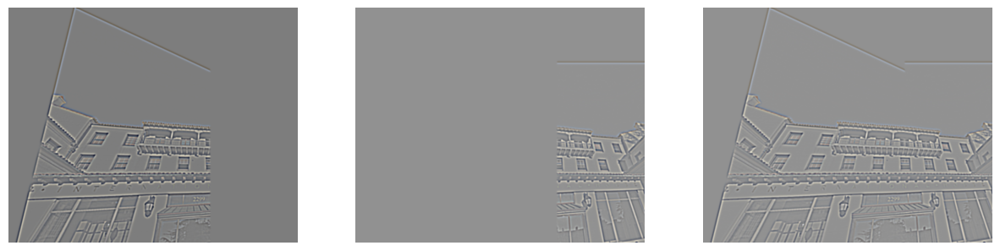

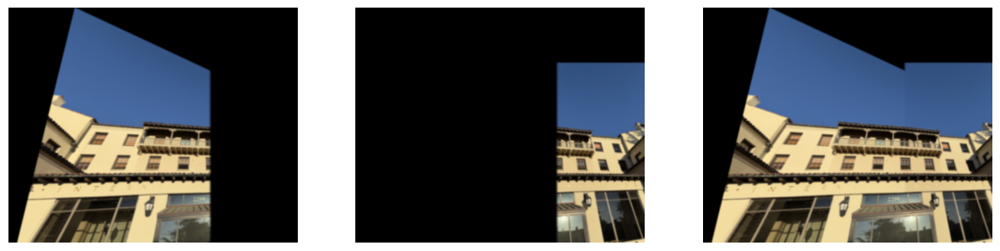

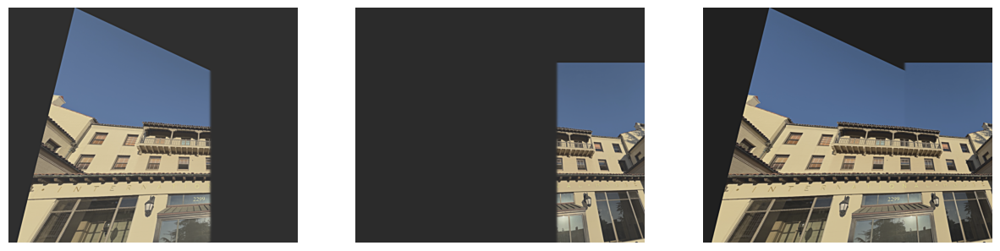

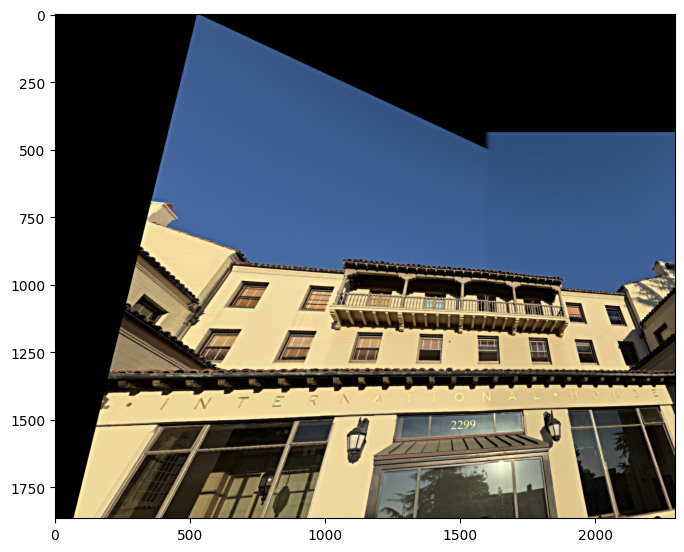

In [50]:
# Create Mask
half_mask = np.zeros(warped_hw1.shape[:-1], dtype=np.uint8)

# We want half of the matrix to be white
half_mask[:, :1600] = 1

# The bar on top is like waay to close to the camera which makes the result seem confusing which is why i cut it
new = go_mosaic(warped_hw1, warped_hw2, half_mask)
ihousefinal = np.clip(new, 0, 1)
plt.imshow(ihousefinal)
plt.show()
plt.imsave('output/ransac_mosaic3_final.jpg', ihousefinal)

In [67]:
plt.imsave('output/ransac_mosaic3_final.jpg', ihousefinal)